In [22]:
import random
import timeit
import matplotlib.pyplot as plt

1a. **Fixed position in the array**


In [30]:
def partition(array, low, high):
    pivot = array[high]
    i = low - 1
    for j in range(low, high):
        if array[j] <= pivot:
            i = i + 1
            array[i], array[j] = array[j], array[i]
    array[i + 1], array[high] = array[high], array[i + 1]
    return i + 1
def quick_sort(array, low, high):
    if low < high:
        pivot = partition(array, low, high)
        quick_sort(array, low, pivot - 1)
        quick_sort(array, pivot + 1, high)


1b. **Deterministic median of the array**

In [29]:
mediancomparison = 0
def quicksort_median(array, leftindex, rightindex):
    global mediancomparison
    
    if leftindex < rightindex:
        newpivotindex = partition_median(array, leftindex, rightindex)

        mediancomparison += (rightindex - leftindex - 1)
        quicksort_median(array, leftindex, newpivotindex)


        quicksort_median(array, newpivotindex + 1, rightindex)
        
def partition_median(array, leftend, rightend):
    left = array[leftend]
    right = array[rightend-1]
    length = rightend - leftend
    if length % 2 == 0:
        middle = array[leftend + int(length/2) - 1]
    else:
        middle = array[leftend + int(length/2)]
  
    

    pivot = median(left, right, middle)

    pivotindex = array.index(pivot) #only works if all values in array unique

    array[pivotindex] = array[leftend]
    array[leftend] = pivot

    i = leftend + 1
    for j in range(leftend + 1, rightend):
        if array[j] < pivot:
            temp = array[j]
            array[j] = array[i]
            array[i] = temp
            i += 1

    leftendval = array[leftend]
    array[leftend] = array[i-1]
    array[i-1] = leftendval
    return i - 1 

def median(a, b, c):
    if ( a - b) * (c - a) >= 0:
        return a

    elif (b - a) * (c - b) >= 0:
        return b

    else:
        return c

1c. **Randomized median of the array**

In [28]:
mediancomparison = 0
def quicksort_median_random(array, leftindex, rightindex):
    global mediancomparison
    
    if leftindex < rightindex:
        newpivotindex = partition_median(array, leftindex, rightindex)

        mediancomparison += (rightindex - leftindex - 1)
        quicksort_median_random(array, leftindex, newpivotindex)


        quicksort_median_random(array, newpivotindex + 1, rightindex)
        
def partition_median(array, leftend, rightend):
    left = array[leftend]
    right = array[rightend-1]
    length = rightend - leftend
    if length % 2 == 0:
        middle = array[leftend + int(length/2) - 1]
    else:
        middle = array[leftend + int(length/2)]
  
    

    pivot = median(left, right, middle)

    pivotindex = array.index(pivot) #only works if all values in array unique

    array[pivotindex] = array[leftend]
    array[leftend] = pivot

    i = leftend + 1
    for j in range(leftend + 1, rightend):
        if array[j] < pivot:
            temp = array[j]
            array[j] = array[i]
            array[i] = temp
            i += 1

    leftendval = array[leftend]
    array[leftend] = array[i-1]
    array[i-1] = leftendval
    return i - 1 

def median(a, b, c):
    pos = random.randint(1, 3)
    if pos == 1:
        return a

    elif pos == 2:
        return b

    else:
        return c

1d. **Uniformly random element of the array**

In [27]:
def partition(array, low, high):
    pos = random.randint(low,high)
    pivot = array[pos]
    array[pos], array[high] = array[high], array[pos]
    i = low - 1
    for j in range(low, high):
        if array[j] <= pivot:
            i = i + 1
            array[i], array[j] = array[j], array[i]
    array[i + 1], array[high] = array[high], array[i + 1]
    return i + 1
def quick_sort_uniform(array, low, high):
    if low < high:
        pivot = partition(array, low, high)
        quick_sort_uniform(array, low, pivot - 1)
        quick_sort_uniform(array, pivot + 1, high)

**Derive the time complexity**

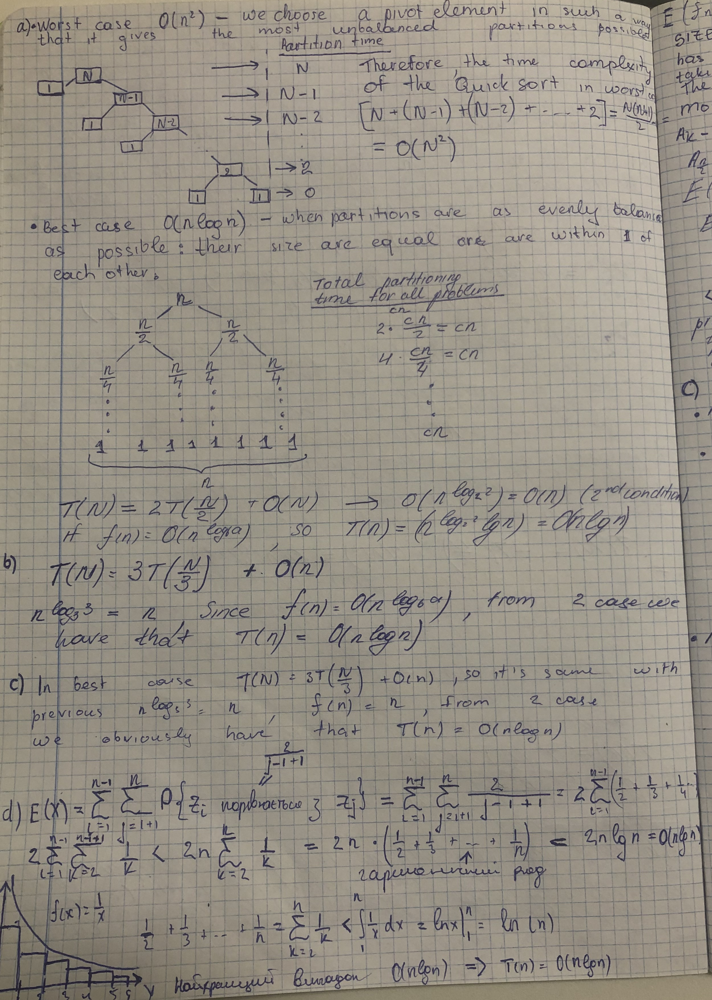

**Obtain actual execution times**

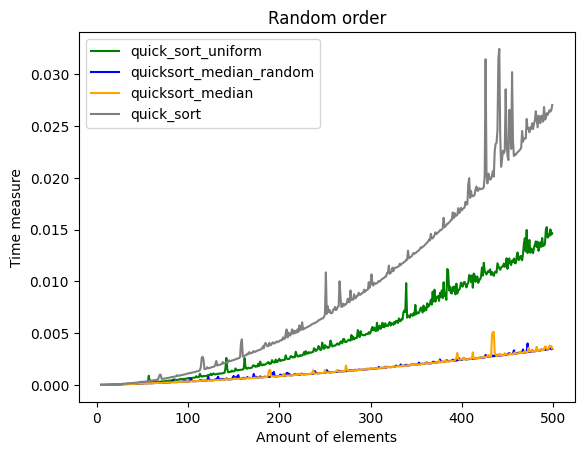

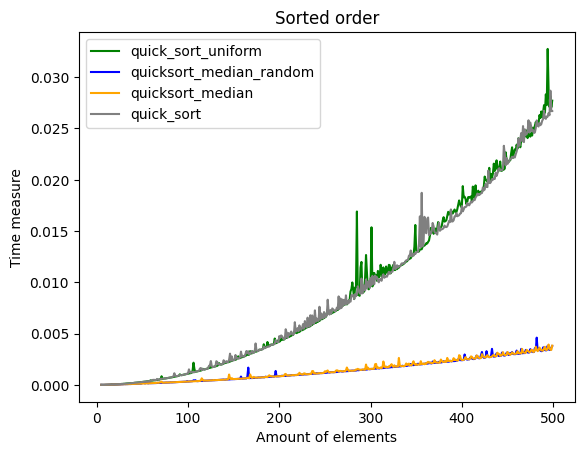

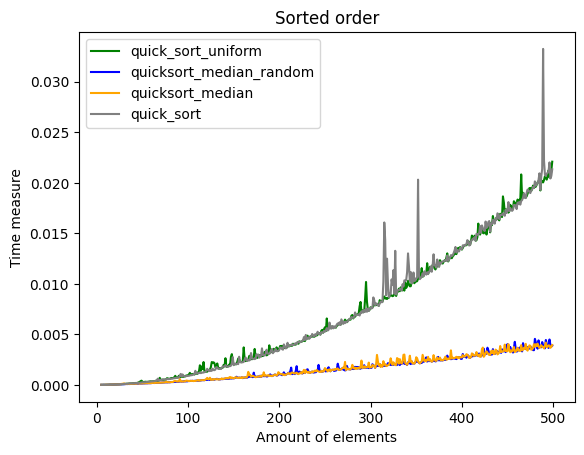

In [31]:
def quick_sort_t(elements):
    result = []
    for i in elements:
        time = timeit.timeit(lambda:quick_sort(i, 0, len(i) - 1), number=2)
        result.append(time)
    return result


def quicksort_median_t(elements):
    result = []
    for i in elements:
        time = timeit.timeit(lambda: quicksort_median(i, 0, len(i) - 1), number=2)
        result.append(time)
    return result

def quicksort_median_random_t(elements):
    result = []
    for i in elements:
        time = timeit.timeit(lambda: quicksort_median_random(i, 0, len(i) - 1), number=2)
        result.append(time)
    return result

def quick_sort_uniform_t(elements):
    result = []
    for i in elements:
        time = timeit.timeit(lambda: quick_sort_uniform(i, 0, len(i) - 1), number=2)
        result.append(time)
    return result


element = [[random.randint(1, 1200)for x in range(i)] for i in range(5,500)]
quick_sort_uniform_time = quick_sort_uniform_t(element)
quicksort_median_random_time = quicksort_median_random_t(element)
quicksort_median_time = quicksort_median_t(element)
quick_sort_time =  quick_sort_t(element)


plt.plot([len(x) for x in element ], quick_sort_uniform_time, 'green')
plt.plot([len(x) for x in element ], quicksort_median_random_time, 'blue')
plt.plot([len(x) for x in element ], quicksort_median_time, 'orange')
plt.plot([len(x) for x in element ], quick_sort_time, 'grey')

plt.legend(["quick_sort_uniform", 'quicksort_median_random', 'quicksort_median', 'quick_sort'])
plt.title("Random order")
plt.ylabel('Time measure')
plt.xlabel('Amount of elements')
plt.show()

quick_sort_uniform_time = quick_sort_uniform_t([sorted(x) for x in element])
quicksort_median_random_time = quicksort_median_random_t([sorted(x) for x in element])
quicksort_median_time = quicksort_median_t([sorted(x) for x in element])
quick_sort_time =  quick_sort_t([sorted(x) for x in element])


plt.plot([len(x) for x in element ], quick_sort_uniform_time, 'green')
plt.plot([len(x) for x in element ], quicksort_median_random_time, 'blue')
plt.plot([len(x) for x in element ], quicksort_median_time, 'orange')
plt.plot([len(x) for x in element ], quick_sort_time, 'grey')

plt.legend(["quick_sort_uniform", 'quicksort_median_random', 'quicksort_median', 'quick_sort'])
plt.title("Sorted order")
plt.ylabel('Time measure')
plt.xlabel('Amount of elements')
plt.show()



quick_sort_uniform_time = quick_sort_uniform_t([sorted(x)[::-1] for x in element])
quicksort_median_random_time = quicksort_median_random_t([sorted(x)[::-1] for x in element])
quicksort_median_time = quicksort_median_t([sorted(x)[::-1] for x in element])
quick_sort_time =  quick_sort_t([sorted(x)[::-1] for x in element])


plt.plot([len(x) for x in element ], quick_sort_uniform_time, 'green')
plt.plot([len(x) for x in element ], quicksort_median_random_time, 'blue')
plt.plot([len(x) for x in element ], quicksort_median_time, 'orange')
plt.plot([len(x) for x in element ], quick_sort_time, 'grey')

plt.legend(["quick_sort_uniform", 'quicksort_median_random', 'quicksort_median', 'quick_sort'])
plt.title("Sorted order")
plt.ylabel('Time measure')
plt.xlabel('Amount of elements')
plt.show()